In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

## Esercizio 04.1

In [108]:
df=pd.read_csv('pofv_MB.dat', header=None, names=['#vel', 'avg', 'err'], skiprows=1, sep="\s+")

In [109]:

df['avg_norm']=df['avg']/30
df['err_norm']=df['err']/30


In [13]:
def MB(v:np.array, temp:float):
    return (1/((2*np.pi*temp)**(1.5)))*4*np.pi*(v**2)*np.exp(-(v**2)/(2*temp))

/tmp/ipykernel_8227/1449995140.py:2: RuntimeWarning: divide by zero encountered in divide
  return (1/((2*np.pi*temp)**(1.5)))*4*np.pi*(v**2)*np.exp(-(v**2)/(2*temp))
/tmp/ipykernel_8227/1449995140.py:2: RuntimeWarning: invalid value encountered in multiply
  return (1/((2*np.pi*temp)**(1.5)))*4*np.pi*(v**2)*np.exp(-(v**2)/(2*temp))


array([nan, nan, nan])

In [11]:
from scipy.optimize import curve_fit

In [113]:
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

<BarContainer object of 30 artists>

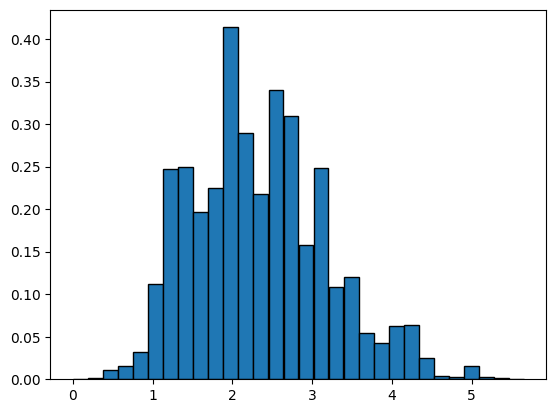

In [114]:
df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')


In [115]:
temp=curve_fit(MB, df0['#vel'], df0['avg_norm'])[0]
temp

array([2.41315775])

In [116]:
mb=MB(df0['#vel'], temp)

mb.argmax()

11

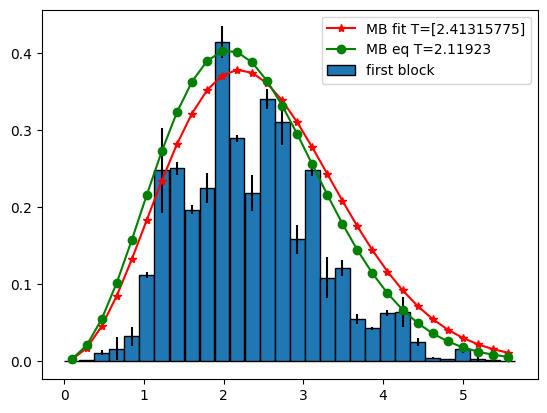

In [117]:
plt.bar(df0['#vel'], df0['avg_norm'], yerr=df0['err_norm'], label='first block', width=df0['#vel'].max()/30, edgecolor='black')
plt.plot(df0['#vel'], MB(df0['#vel'], temp), marker='*', c='r', label=f'MB fit T={temp}')
plt.plot(df0['#vel'], MB(df0['#vel'], 2.11923), marker='o', c='g', label=f'MB eq T={2.11923}')
#plt.vlines(df0['#vel'][9], ymin=0, ymax=7, colors='r')
plt.legend()
plt.show()

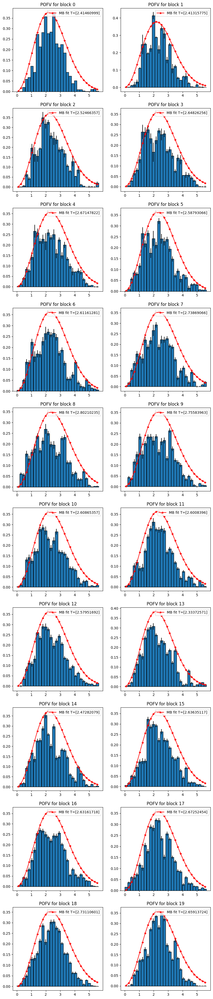

In [118]:
fig, ax=plt.subplots(nrows=10, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(50)

for k in range(20):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].legend()
plt.show()

## Esercizio 04.2

In [24]:
df=pd.read_csv('pofv_delta.dat', header=None, names=['#vel', 'avg', 'err'], skiprows=1, sep="\s+")

In [25]:

df['avg_norm']=df['avg']/30
df['err_norm']=df['err']/30
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

<BarContainer object of 30 artists>

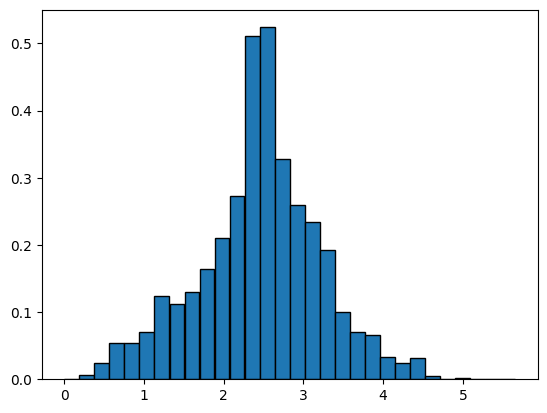

In [26]:
df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')


In [27]:
temp_s=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/temperature.dat', delim_whitespace=True,
    names=['# BLOCK:', 'ACTUAL_T:', 'T_AVE:', 'ERROR:'], skiprows=1)
temp_s

,# BLOCK:,ACTUAL_T:,T_AVE:,ERROR:
0,1,2.18227,2.18227,0.000000
1,2,2.19430,2.18829,0.004256
2,3,2.18991,2.18883,0.002872
3,4,2.20747,2.19349,0.004575
4,5,2.19354,2.19350,0.003660
5,6,2.18288,2.19173,0.003452
6,7,2.19157,2.19171,0.002959
7,8,2.18546,2.19093,0.002690
8,9,2.19247,2.19110,0.002397
9,10,2.21331,2.19332,0.003016


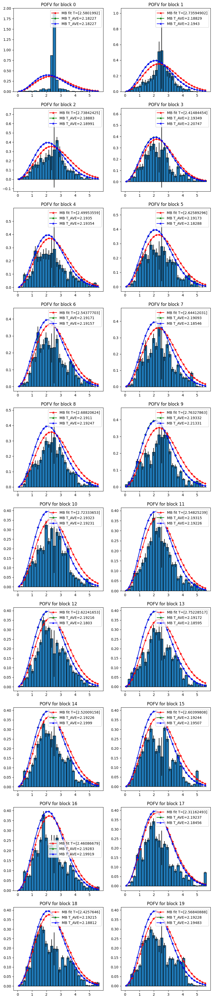

In [28]:
fig, ax=plt.subplots(nrows=10, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(50)

for k in range(20):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['T_AVE:'][k])
        , marker='*', c='g', label=f'MB T_AVE={temp_s["T_AVE:"][k]}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['ACTUAL_T:'][k])
        , marker='*', c='b', label=f'MB T_AVE={temp_s["ACTUAL_T:"][k]}')
    
    
    
    ax[k//2, k%2].legend()
plt.show()

In [35]:
df=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/pofv.dat', 
    header=None, 
    names=['#vel', 'avg', 'prog_avg', 'err'], skiprows=1, sep="\s+")

In [36]:
df

,#vel,avg,prog_avg,err
0,0.094281,0.000,0.000000,0.000000
1,0.282843,0.000,0.000000,0.000000
2,0.471405,0.000,0.000000,0.000000
3,0.659966,0.000,0.000000,0.000000
4,0.848528,0.000,0.000000,0.000000
...,...,...,...,...
5995,4.808330,0.085,0.595150,0.052835
5996,4.996890,0.045,0.585650,0.053568
5997,5.185450,0.515,0.243575,0.027687
5998,5.374010,0.370,0.175650,0.025575


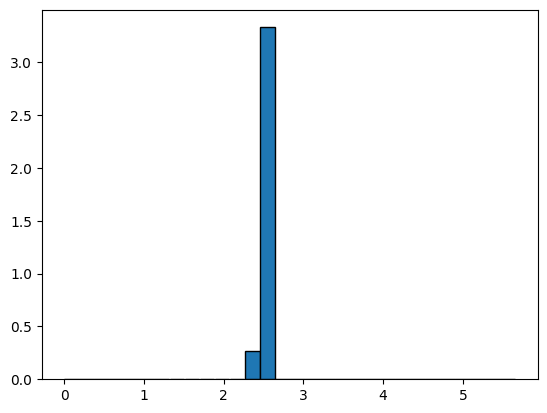

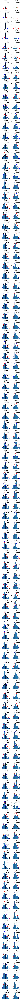

In [41]:

df['avg_norm']=df['avg']/30
df['err_norm']=df['err']/30
df['block']=0
counter=0
df['block']=df.index//30
#for k in df.index[:]:
#    if k%30==0:
#        counter+=1
#    df['block'][k]=counter
    

df0=df.loc[df['block']==1]
plt.bar(df0['#vel'], df0['avg_norm'], width=df0['#vel'].max()/30, edgecolor='black')


temp_s=pd.read_csv(
    'NSL_SIMULATOR/OUTPUT/temperature.dat', delim_whitespace=True,
    names=['# BLOCK:', 'ACTUAL_T:', 'T_AVE:', 'ERROR:'], skiprows=1)
temp_s

fig, ax=plt.subplots(nrows=100, ncols=2)
fig.set_figwidth(10)
fig.set_figheight(500)

for k in range(200):
    dfb=df.loc[df['block']==k].reset_index(drop=True)
    temp=curve_fit(MB, dfb['#vel'], dfb['avg_norm'])[0]
    ax[k//2,  k%2].set_title(f'POFV for block {k}')
    ax[k//2,  k%2].bar(
        dfb['#vel'], dfb['avg_norm'], 
        yerr=dfb['err_norm'], 
        width=dfb['#vel'].max()/30, edgecolor='black')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp)
        , marker='*', c='r', label=f'MB fit T={temp}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['T_AVE:'][k])
        , marker='*', c='g', label=f'MB T_AVE={temp_s["T_AVE:"][k]}')
    ax[k//2, k%2].plot(
        dfb['#vel'], MB(dfb['#vel'], temp_s['ACTUAL_T:'][k])
        , marker='*', c='b', label=f'MB T_AVE={temp_s["ACTUAL_T:"][k]}')
    
    
    
    ax[k//2, k%2].legend()
plt.show()

## Esercizio 04.3 [back to the future]

([<matplotlib.axis.XTick at 0x7ff238f703d0>,
 [Text(0, 0, '\x00'),
  Text(1, 0, '\x01'),
  Text(2, 0, '\x02'),
  Text(3, 0, '\x03'),
  Text(4, 0, '\x04'),
  Text(5, 0, '\x05'),
  Text(6, 0, '\x06'),
  Text(7, 0, '\x07'),
  Text(8, 0, '\x08'),
  Text(9, 0, '\t'),
  Text(10, 0, '\n'),
  Text(11, 0, '\x0b'),
  Text(12, 0, '\x0c'),
  Text(13, 0, '\r'),
  Text(14, 0, '\x0e'),
  Text(15, 0, '\x0f'),
  Text(16, 0, '\x10'),
  Text(17, 0, '\x11'),
  Text(18, 0, '\x12'),
  Text(19, 0, '\x13')])

/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 0 ( ) missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 1 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 2 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 3 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 4 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Glyph 5 () missing from current font.
  func(*args, **kwargs)
/home/tommaso/.local/lib/python3.10/site-packages/IPython/core/events.py:89: UserW

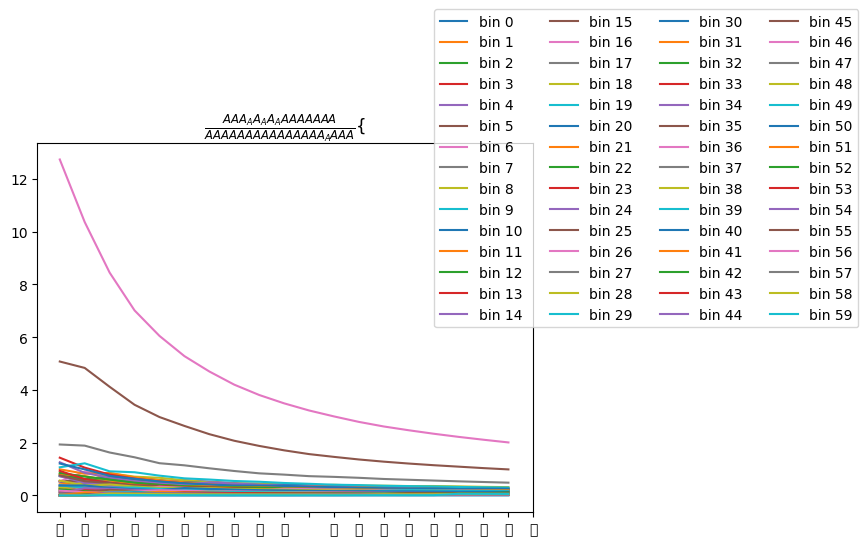

In [175]:
plt.title(r'$\frac{AAA_AA_AA_AAAAAAAA}{AAAAAAAAAAAAAAA_AAAA}\{$')
for j in range(60):
    plt.plot([df.loc[df['block']==k].reset_index().err[j] for k in range(1, 20)], label=f'bin {j}')
plt.legend(ncols=4, loc=(0.8,0.5))
plt.xticks(range(0, 20), [chr(k) for k in range(20)])
